###Importing

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder, MinMaxScaler ,PolynomialFeatures
from imblearn.over_sampling import SMOTE
from sklearn.decomposition import PCA

from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier , GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier

from sklearn.model_selection import cross_val_score, train_test_split ,KFold
from sklearn.metrics import mean_squared_error, accuracy_score
from sklearn import metrics
from sklearn.metrics import confusion_matrix

#Describe Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

#read the data set and save it as dataframe
df = pd.read_excel(r"/content/drive/MyDrive/DA350 Final Project/Dataset#1.xlsx")     #(r"/content/drive/MyDrive/DA350/Dataset#1.xlsx")
df.head()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,Feature1,Feature2,Feature3,Feature4,Feature5,Feature6,Feature7,Feature8,Feature9,Feature10,Feature11,Feature12,Feature13,Feature14,Feature15,Feature16,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


In [ ]:
df["Class"].unique()
#There is 7 target classes

array(['SEKER', 'BARBUNYA', 'BOMBAY', 'CALI', 'HOROZ', 'SIRA', 'DERMASON'],
      dtype=object)

In [ ]:
df.shape

(13611, 17)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Feature1   13611 non-null  int64  
 1   Feature2   13611 non-null  float64
 2   Feature3   13611 non-null  float64
 3   Feature4   13611 non-null  float64
 4   Feature5   13611 non-null  float64
 5   Feature6   13611 non-null  float64
 6   Feature7   13611 non-null  int64  
 7   Feature8   13611 non-null  float64
 8   Feature9   13611 non-null  float64
 9   Feature10  13611 non-null  float64
 10  Feature11  13611 non-null  float64
 11  Feature12  13611 non-null  float64
 12  Feature13  13611 non-null  float64
 13  Feature14  13611 non-null  float64
 14  Feature15  13611 non-null  float64
 15  Feature16  13611 non-null  float64
 16  Class      13611 non-null  object 
dtypes: float64(14), int64(2), object(1)
memory usage: 1.8+ MB


Feature1 , Feature7 ---> int

Class ---> Object

Others --> Float

In [ ]:
df.describe()

,Feature1,Feature2,Feature3,Feature4,Feature5,Feature6,Feature7,Feature8,Feature9,Feature10,Feature11,Feature12,Feature13,Feature14,Feature15,Feature16
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860153,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


Feature1 , Feature7 --> have **very high std**

In [ ]:
df.isnull().sum().sum()

0

**As we can see there is no missing valuse**

##Data Analysis

###Duplicated

In [ ]:
df.duplicated(subset=None, keep='first').sum() #count the dublicated records

68

We can see there is 68 duplicate records we must handle and we notice that they are all from the same class

###Imbalance problem

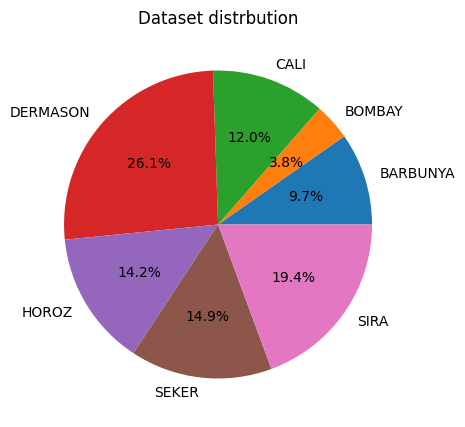

<Axes: xlabel='Class', ylabel='count'>

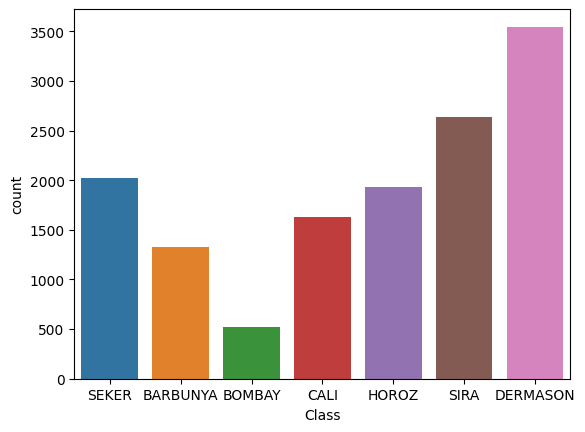

In [ ]:
labels, counts = np.unique(df.Class, return_counts=True)

plt.figure(figsize=(7, 5))
plt.pie(counts, autopct='%1.1f%%', labels=labels)
plt.title('Dataset distrbution')
plt.show()
sns.countplot(x='Class', data=df)

###OutLiers

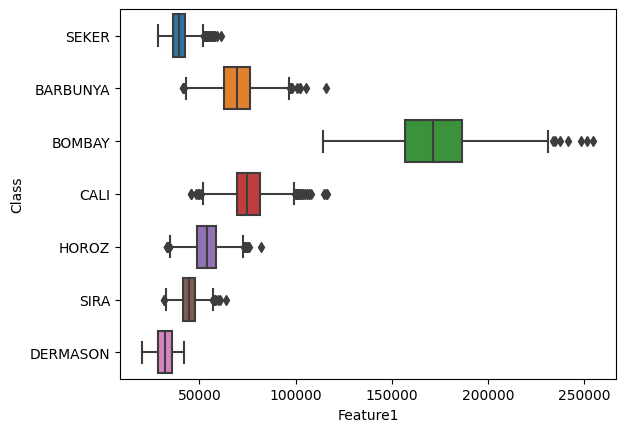

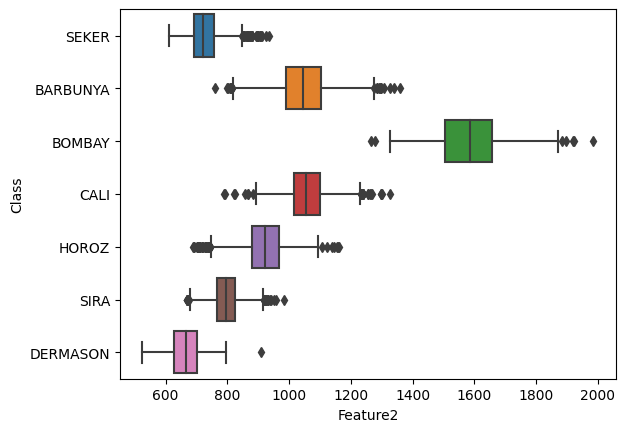

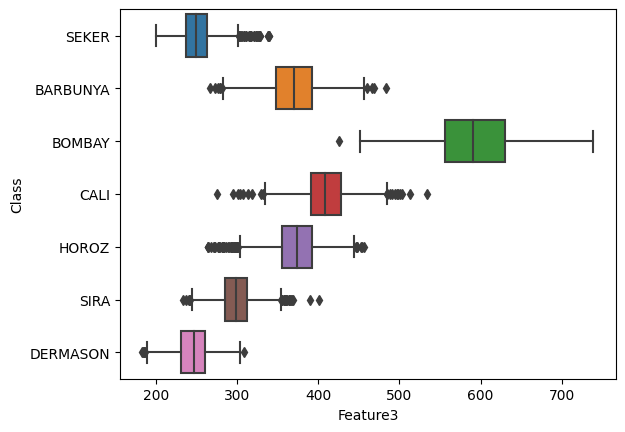

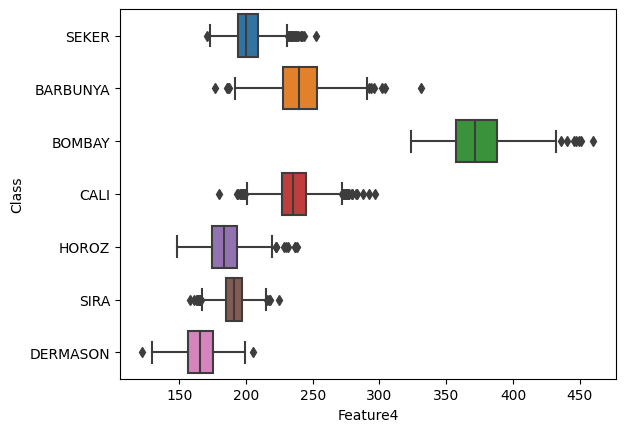

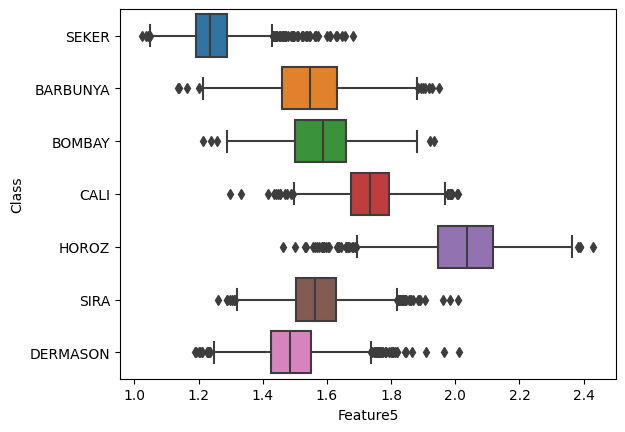

...

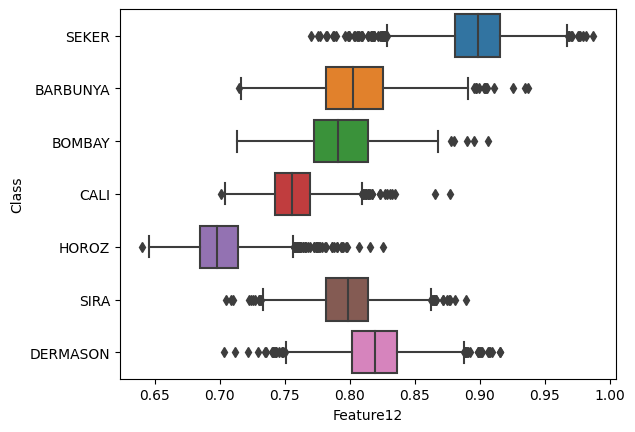

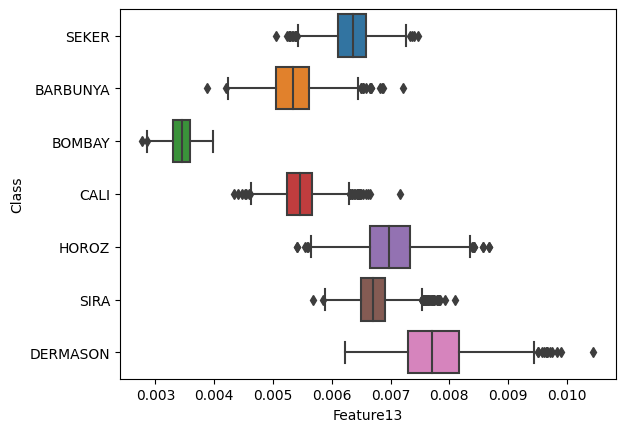

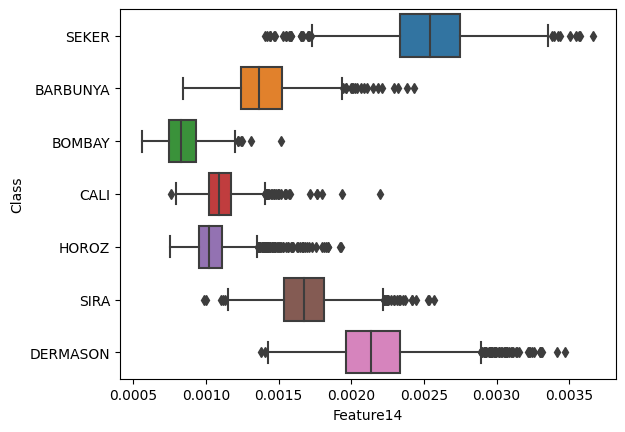

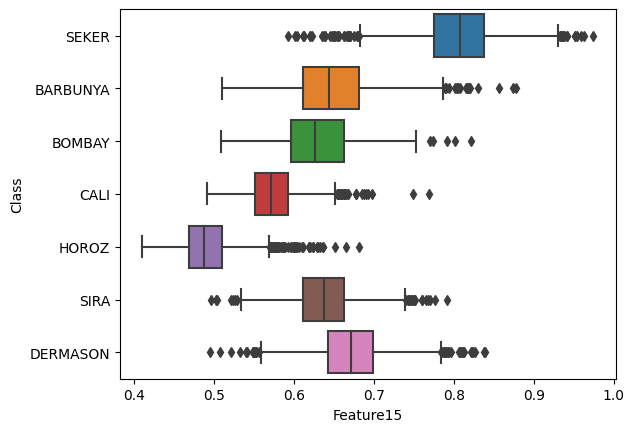

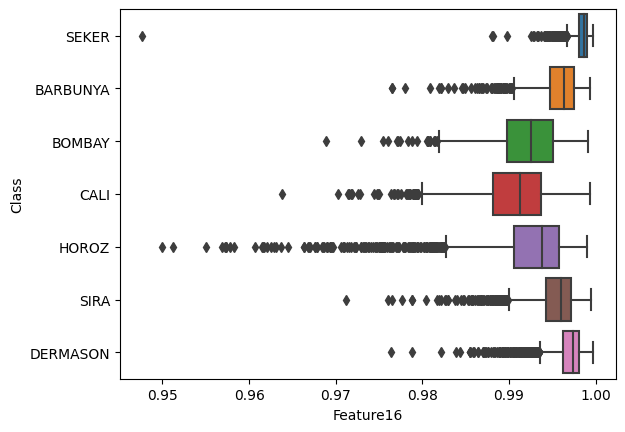

In [ ]:
columns = df.drop("Class",axis=1).columns
columns
for i in columns:
   sns.boxplot(df, x=i, y='Class') ;plt.show()


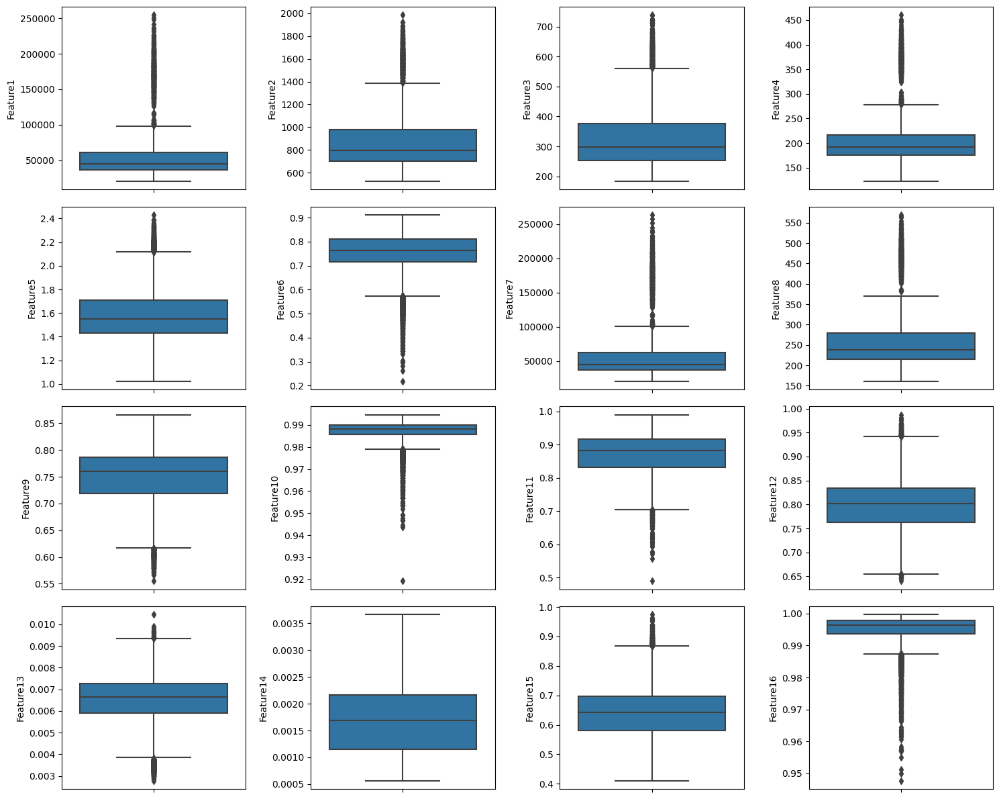

In [ ]:
fig, ax = plt.subplots(4, 4, figsize=(15, 12))

for variable, subplot in zip(columns, ax.flatten()):
    sns.boxplot(y= df[variable], ax=subplot)
plt.tight_layout()

In [ ]:
import numpy as np
import pandas as pd

def count_outliers(dataframe, threshold=1.5):
    outlier_counts = {}
    columns = dataframe.columns.to_list()
    columns.pop()

    for column in columns:
        # Calculate the IQR for the column
        q1 = dataframe[column].quantile(0.25)
        q3 = dataframe[column].quantile(0.75)
        iqr = q3 - q1

        # Define the lower and upper bounds for outliers
        lower_bound = q1 - threshold * iqr
        upper_bound = q3 + threshold * iqr

        # Count the number of outliers in the column
        outliers = dataframe[(dataframe[column] < lower_bound) | (dataframe[column] > upper_bound)]
        outlier_count = outliers.shape[0]

        outlier_counts[column] = outlier_count

    return outlier_counts

# Example usage:
# Assuming 'your_dataframe' is your Pandas DataFrame
outlier_counts = count_outliers(df.copy())
for i in outlier_counts : print(i,outlier_counts[i])


###Distribution

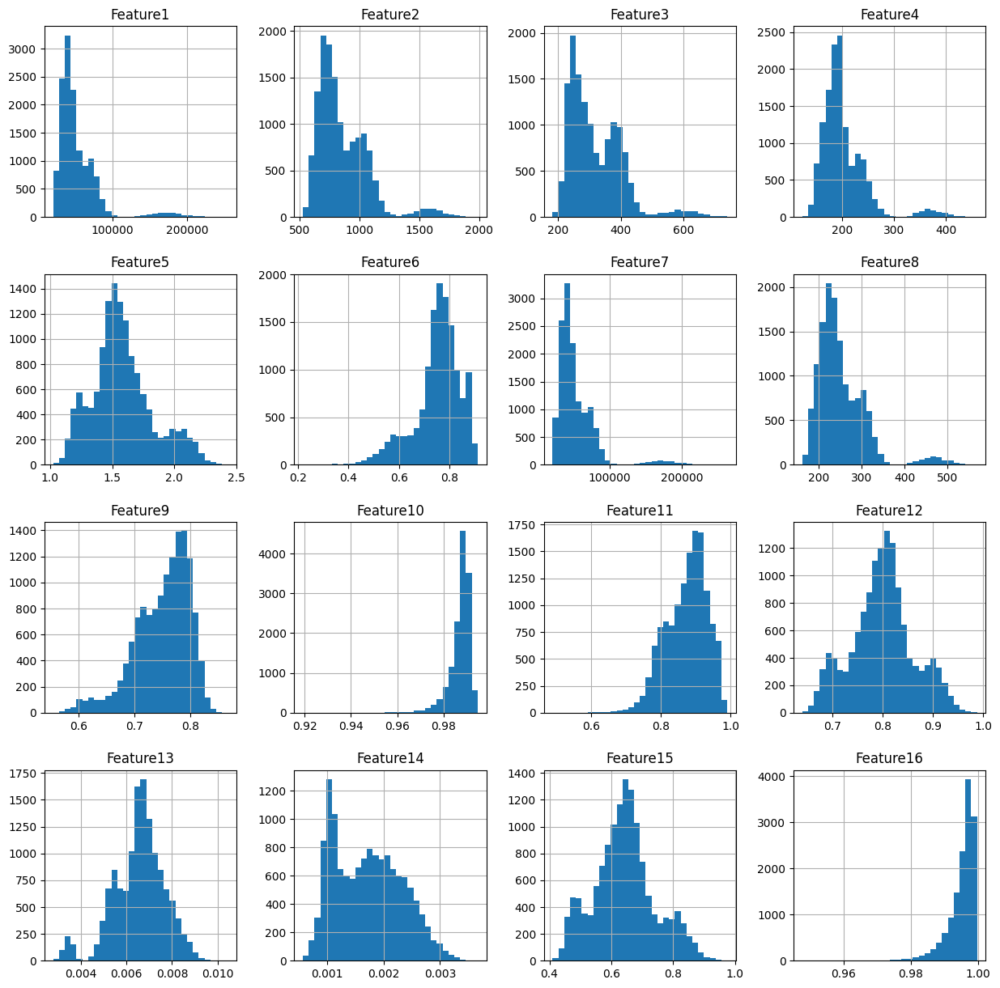

In [ ]:
df.hist(bins=30, figsize=(15,15))
plt.show()

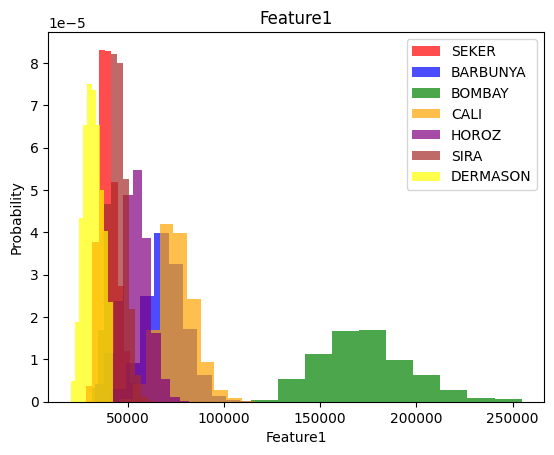

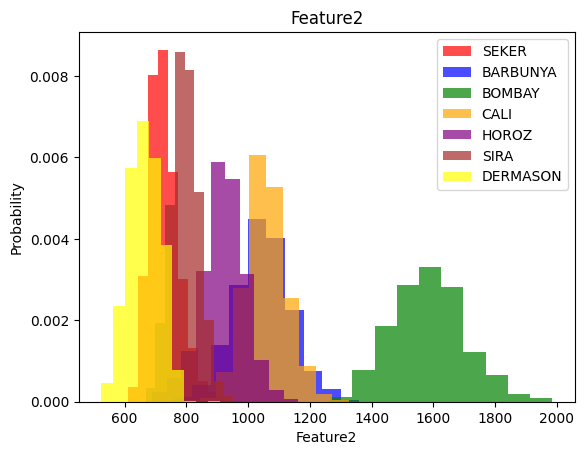

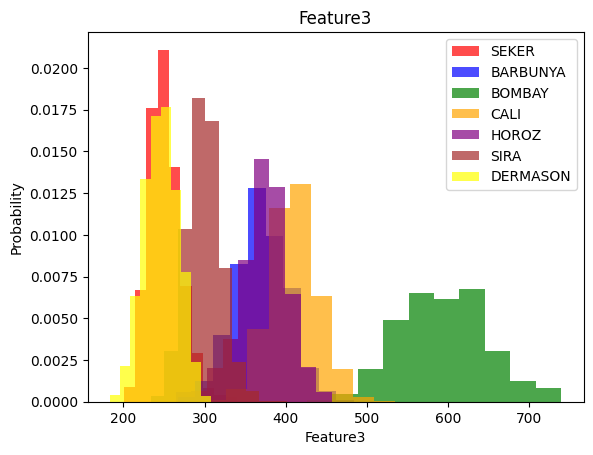

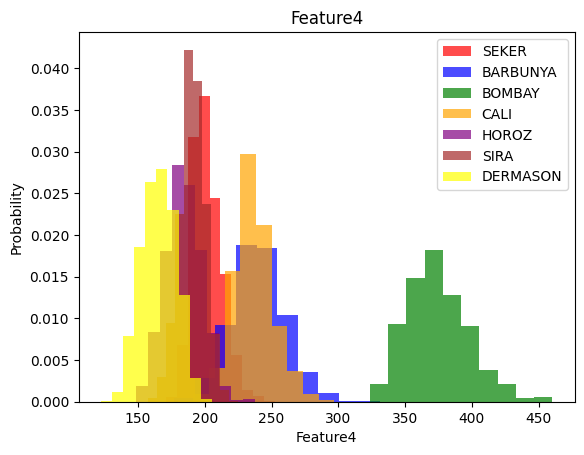

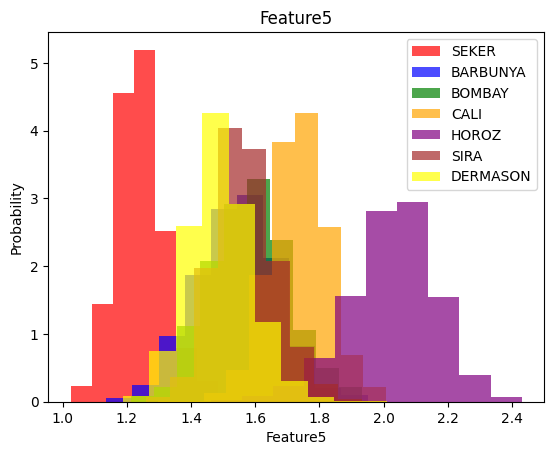

...

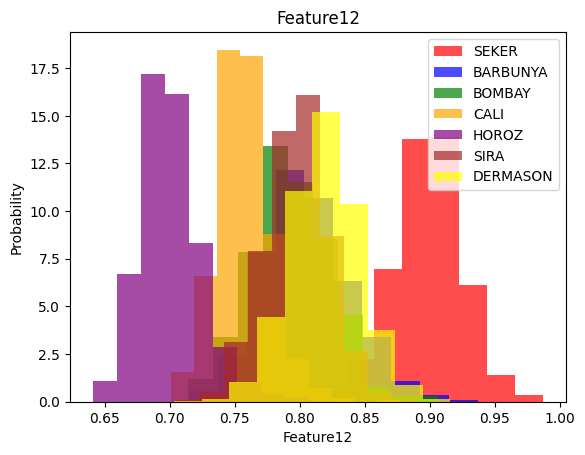

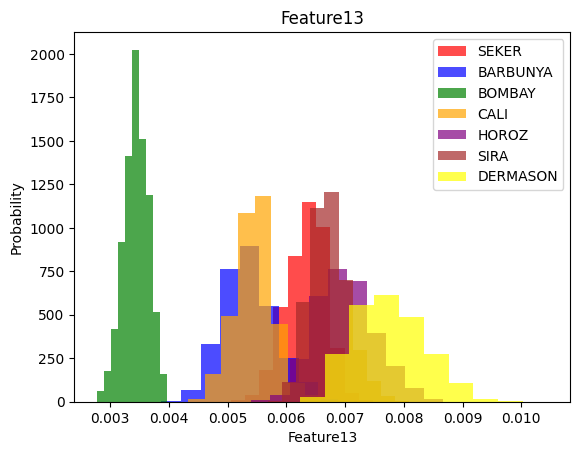

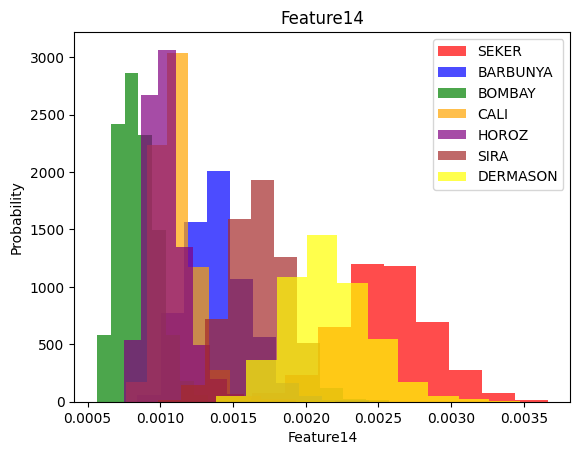

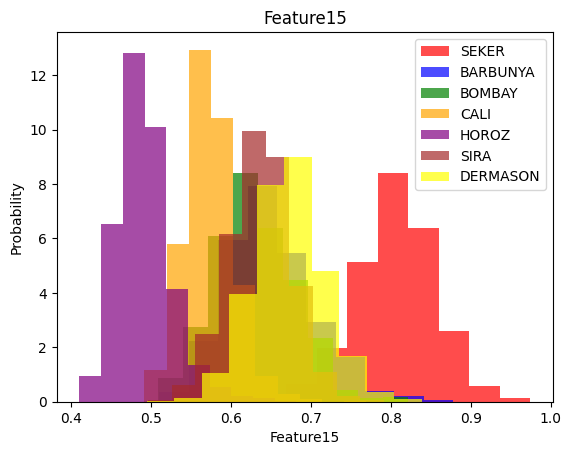

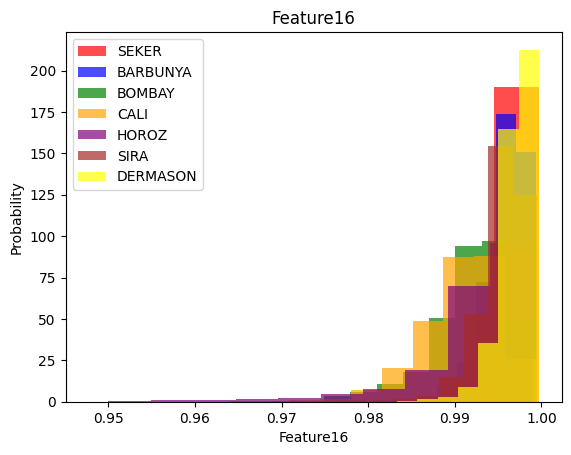

In [ ]:
cols = df.columns
Class_Values= df.Class.unique()
colors = ["red","blue","green","orange","purple" ,"brown" ,"yellow"]
for col in cols[:-1]:
  for className,classColor in zip(Class_Values,colors) :
    plt.hist(df[df["Class"]==className][col], color=classColor, label=className, alpha=0.7, density=True)
  plt.title(col)
  plt.ylabel("Probability")
  plt.xlabel(col)
  plt.legend()
  plt.show()

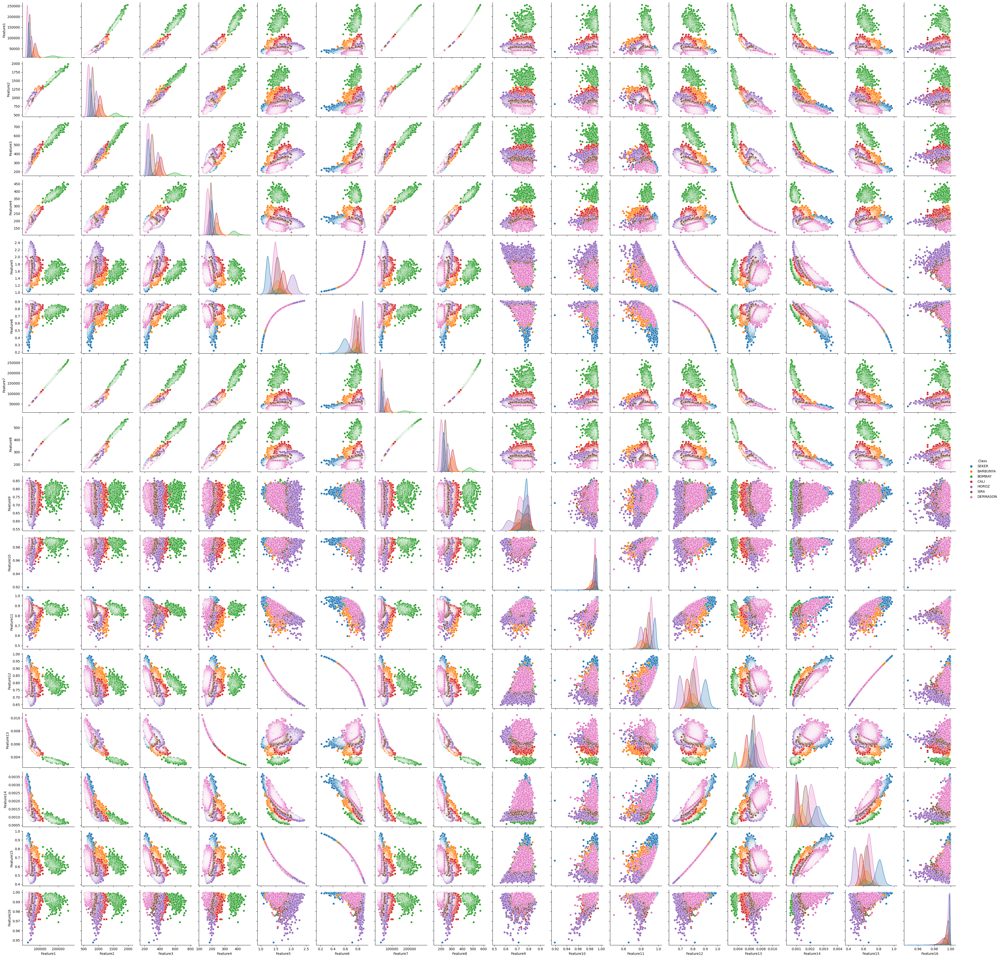

In [ ]:
sns.pairplot( df, hue="Class")



```
sns.pairplot( df, hue="Class")
```




<ipython-input-70-ba20a430e92c>:7: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corrmat= df.corr()


<Axes: >

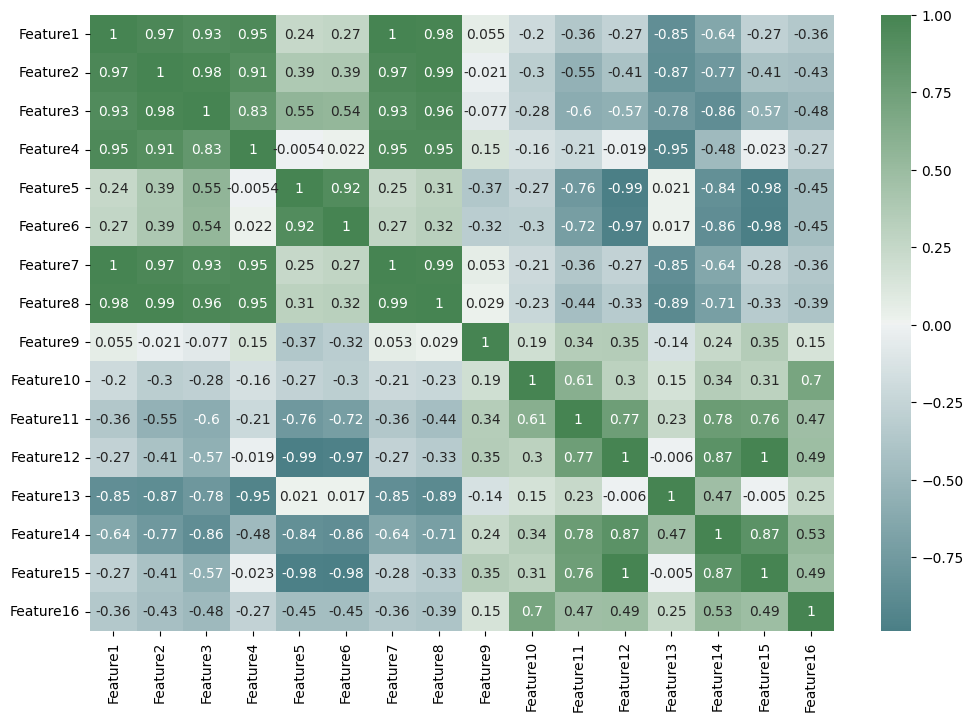

In [ ]:
#correlation matrix
import seaborn as sns
import matplotlib.pyplot as plt

cmap = sns.diverging_palette(205, 133, 63,as_cmap=True)
corrmat= df.corr()
f, ax = plt.subplots(figsize=(12,8))
sns.heatmap(corrmat,cmap=cmap,annot=True, )

Feature7 and Feature8 are correlated with many other Features ...

we may drop them

# Preprossing

In [ ]:
sm = SMOTE(random_state=42) #Synthetic Minority Over-sampling Technique (SMOTE) :the primary focuse is to add more samples to the monitory class to ahcive balance dataset and solve the imbalance problem

le = LabelEncoder()
df["Class"] = le.fit_transform(df["Class"])

X = df.drop('Class', axis=1)
y = df.Class

X_sm, y_sm = sm.fit_resample(X, y)#resample to avoid the imbalance
y_sm.value_counts()

5    3546
0    3546
1    3546
2    3546
4    3546
6    3546
3    3546
Name: Class, dtype: int64

As we can see ....

the imbalance problem now has been solved

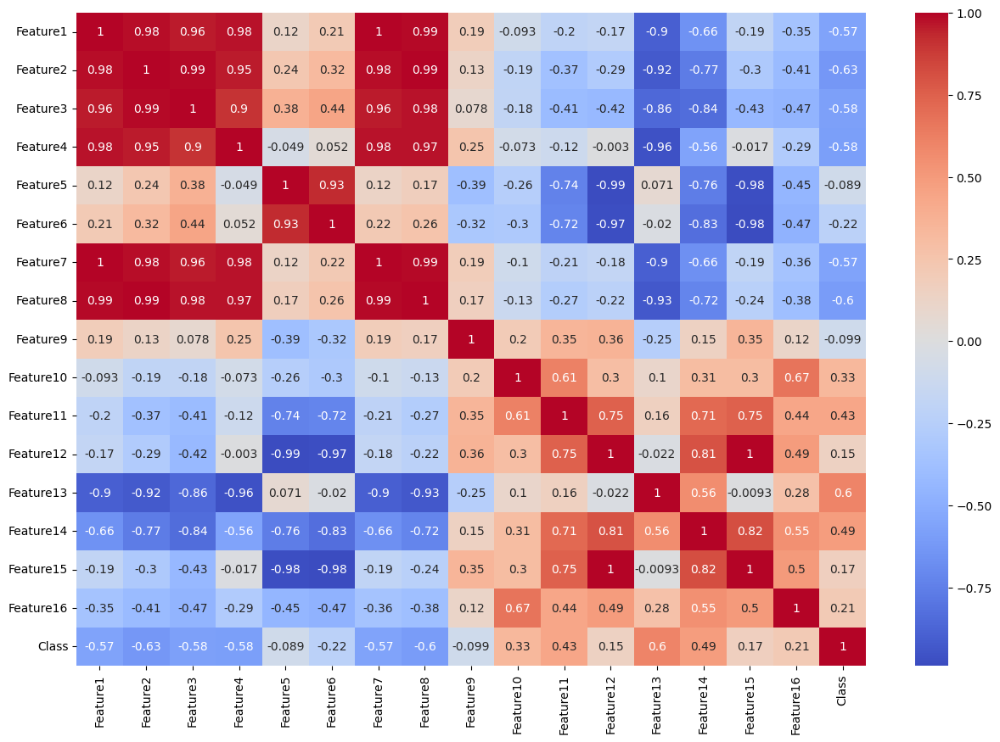

In [ ]:
plt.figure(figsize=(15, 10))
sns.heatmap(data=pd.concat([X_sm, y_sm],axis=1).corr(), cmap='coolwarm', annot=True)
plt.show()

In [ ]:
df.drop_duplicates(inplace=True) #remove the dublicated records
df.duplicated(subset=None, keep='first').sum()

In [ ]:
X_sm.drop(["Feature2","Feature7","Feature8","Feature12","Feature9"],axis=1,inplace=True) # 7 bad more than 8

In [ ]:
#X_sm = X_sm[X_sm['Feature16'] >= 0.96]
#X_sm = X_sm[X_sm['Feature13'] <= 0.010]
#X_sm = X_sm[X_sm['Feature1'] <= 230000]
#X_sm = X_sm[X_sm['Feature3'] <= 700]
#X_sm = X_sm[X_sm['Feature4'] <= 450]

In [ ]:
#X_sm.drop(["Feature8"],axis=1,inplace=True) # 7 bad more than 8

split the data set and normalize it

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_sm, y_sm, random_state=42, shuffle=True, test_size=0.2)

sc = StandardScaler()
X_train_scaled = sc.fit_transform(X_train)
X_test_scaled = sc.transform(X_test)
X_train_scaled

array([[-0.05162995,  0.34930546, -0.20531235, ..., -0.82779527,
        -1.10664158,  0.39620929],
       [ 2.15546676,  2.0293857 ,  2.0696149 , ..., -1.19654986,
        -0.29769071, -1.27047428],
       [ 0.1099233 ,  0.25296908,  0.25038362, ..., -0.47950894,
        -0.16250263,  0.33124695],
       ...,
       [-0.68409373, -1.0178614 , -0.43655834, ...,  1.65662929,
         1.71463225,  0.99468487],
       [ 2.62942301,  2.23815194,  2.50533833, ..., -1.18363249,
        -0.00460934,  0.22937289],
       [-0.61371603, -0.89677418, -0.35715991, ...,  1.32503346,
         1.48335326,  0.97273829]])

In [ ]:
#polyy = PolynomialFeatures(2)

#poly_trainn = polyy.fit_transform(encoded_train)
#poly_testt = polyy.fit_transform(encoded_test)
#poly_trainn

#Modeling

In [ ]:
classifier = LogisticRegression(solver='lbfgs')
classifier.fit(X_train_scaled , y_train)
print(classifier.intercept_, classifier.coef_)

y_pred = classifier.predict(X_test_scaled )

[ 4.31615899 -2.4640867   3.80382654 -6.7526573  -0.67666723  0.19087325
  1.58255245] [[ 5.94655482e-01  5.94868945e-02  2.37575516e+00 -1.74505701e+00
  -1.36087242e+00 -1.53910694e+00 -1.83907318e+00 -2.17388846e+00
  -3.36038874e+00  7.15026545e-01  2.23886890e+00]
 [ 4.42612373e+00  3.49716416e+00  4.25593946e+00 -7.28255071e-01
  -7.00531491e-01 -1.57720924e-01  8.72501024e-01 -2.84176354e+00
  -1.10972655e+00  7.37824818e-01 -6.56986963e-01]
 [ 2.69405703e-02  2.03435191e+00  7.47331136e-01  1.36747335e+00
   9.19046430e-02  5.17508794e-04  2.01733515e+00 -4.31952108e+00
  -1.82177638e+00 -1.02718343e+00 -1.31332128e+00]
 [-2.27996038e+00 -3.52921918e+00 -3.30662004e+00 -1.16504957e+00
   2.07785880e+00 -2.01277986e-01  1.55106875e+00  6.38762251e+00
   2.43814784e+00 -2.13352348e-01  2.25612860e-01]
 [ 1.36072940e-01  6.39906966e-01 -1.07315620e+00  4.22070855e+00
  -2.61713279e-01  9.40938403e-01 -1.39612017e+00  3.47855665e+00
   1.48697718e+00 -1.24053105e+00 -2.17247833e+00

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
print(f'The model accuracy is: {accuracy_score(y_test, y_pred)}')


The model accuracy is: 0.9444108761329305


In [ ]:
#build model
DT = DecisionTreeClassifier(criterion = 'entropy')
RF = RandomForestClassifier(n_estimators=200,max_depth=20,random_state=0,criterion = 'entropy')
NB = GaussianNB()
KNN = KNeighborsClassifier(10)
SVM = SVC(kernel="rbf")
GBC =  GradientBoostingClassifier()
XGBC = XGBClassifier()

l=[DT,RF,NB,KNN,SVM,GBC,XGBC]

In [ ]:
#fitting the model
for i in l :
    i.fit(X_train_scaled,y_train)

#predict & calculate Erorr
for i in l :
    Py= i.predict(X_test_scaled)

    print(f'the accurcy of {i} = {accuracy_score(y_test, Py)}\n{confusion_matrix(y_test, Py)}\n\n')

In [ ]:
X_sm, y_sm
for i in l:
    kfold = KFold(n_splits=5, shuffle=True, random_state=42)
    cv_results = cross_val_score(i,  X_sm, y_sm, cv=kfold, scoring='accuracy',error_score='raise')
    print("{} -> CV_MSE: {}".format(i,-cv_results.mean()))
    print("cv_results:",-cv_results)
    print("\n.......New........")


In [ ]:
The model accuracy is: 0.9444108761329305
the accurcy of DecisionTreeClassifier() = 0.9293051359516616
[[680   0  18   0   5   2  12]
 [  1 714   0   0   0   0   0]
 [ 17   0 682   0  21   4   3]
 [  2   0   0 631   3  14  65]
 [  9   0  12   7 657   0  18]
 [  2   0   1  17   1 657  13]
 [ 11   0   2  68  12  11 593]]


the accurcy of RandomForestClassifier(max_depth=20, n_estimators=200, random_state=0) = 0.9518630412890232
[[682   0  22   0   3   1   9]
 [  0 715   0   0   0   0   0]
 [ 17   0 699   0   8   1   2]
 [  0   0   0 657   1  10  47]
 [  4   0   4  10 673   0  12]
 [  0   0   0  11   0 671   9]
 [  1   0   1  48   9   9 629]]


the accurcy of GaussianNB() = 0.9240684793554884
[[627   0  61   0   2   2  25]
 [  0 715   0   0   0   0   0]
 [ 48   0 664   0  12   0   3]
 [  2   0   0 631   1  17  64]
 [  1   0  12   7 670   0  13]
 [  4   0   0   6   0 665  16]
 [  2   0   2  48  16  13 616]]


the accurcy of KNeighborsClassifier(n_neighbors=10) = 0.9484390735146022
[[690   0  16   0   0   2   9]
 [  0 715   0   0   0   0   0]
 [ 17   0 695   0  10   2   3]
 [  0   0   0 656   2  13  44]
 [  1   0  11   7 670   0  14]
 [  6   0   0   8   0 669   8]
 [  3   0   2  62   5  11 614]]


the accurcy of SVC() = 0.9498489425981873
[[687   0  24   0   1   0   5]
 [  0 715   0   0   0   0   0]
 [ 16   0 695   0  10   2   4]
 [  0   0   0 647   2  12  54]
 [  2   0   8   6 673   0  14]
 [  2   0   0   8   0 672   9]
 [  0   0   2  49   9  10 627]]


the accurcy of GradientBoostingClassifier() = 0.9458207452165156
[[679   0  26   0   1   1  10]
 [  1 714   0   0   0   0   0]
 [ 14   0 695   0  10   3   5]
 [  1   0   0 652   2  11  49]
 [  4   0   5   7 670   0  17]
 [  2   0   0  10   0 670   9]
 [  2   0   1  56   9  13 616]]


the accurcy of XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...) = 0.9536757301107754
[[690   0  16   0   2   0   9]
 [  0 715   0   0   0   0   0]
 [ 14   0 700   0   8   2   3]
 [  0   0   0 657   0   9  49]
 [  4   0   5   7 675   0  12]
 [  1   0   0   9   0 671  10]
 [  1   0   1  52   7   9 627]]


In [ ]:
X_sm, y_sm
scaler = StandardScaler()
TX = scaler.fit_transform(X_sm) #Train x scaled

for i in l:
    kfold = KFold(n_splits=5, shuffle=True, random_state=42)
    cv_results = cross_val_score(i,  TX, y_sm, cv=kfold, scoring='accuracy',error_score='raise')
    print("{} -> CV_MSE: {}".format(i,-cv_results.mean()))
    print("cv_results:",-cv_results)
    print("\n.......New........")


DecisionTreeClassifier() -> CV_MSE: -0.9326405142200074
cv_results: [-0.92769386 -0.9347432  -0.93654311 -0.92707494 -0.93714746]

.......New........
RandomForestClassifier(max_depth=20, n_estimators=200, random_state=0) -> CV_MSE: -0.9510111960191932
cv_results: [-0.95085599 -0.95125881 -0.95225624 -0.94802579 -0.95265915]

.......New........
GaussianNB() -> CV_MSE: -0.9220849573119816
cv_results: [-0.92406848 -0.92729104 -0.91881547 -0.91680097 -0.92344883]

.......New........
KNeighborsClassifier(n_neighbors=10) -> CV_MSE: -0.9475867332406622
cv_results: [-0.94843907 -0.94884189 -0.94580983 -0.94762288 -0.94721998]

.......New........
SVC() -> CV_MSE: -0.9482314071181591
cv_results: [-0.94984894 -0.94662638 -0.94883159 -0.94641418 -0.94943594]

.......New........
GradientBoostingClassifier() -> CV_MSE: -0.9468616577119612
cv_results: [-0.94582075 -0.94783484 -0.94842869 -0.94500403 -0.94721998]

.......New........
XGBClassifier(base_score=None, booster=None, callbacks=None,
        

In [ ]:
#RF = RandomForestClassifier(n_estimators=150,max_depth=8,random_state=0)
#X=new_train.drop(columns="Survived")
#y=new_train.Survived
#RF.fit(X,y)
#Py = RF.predict(df_test)
#output = pd.DataFrame({'PassengerId': ID, 'Survived': Py})
#output.to_csv('submission.csv', index=False)

#Nural Net

In [ ]:
import tensorflow as tf

In [ ]:
def plot_history(history):
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))
  ax1.plot(history.history['loss'], label='loss')
  ax1.plot(history.history['val_loss'], label='val_loss')
  ax1.set_xlabel('Epoch')
  ax1.set_ylabel('sparse categorical crossentropy')
  ax1.grid(True)

  ax2.plot(history.history['accuracy'], label='accuracy')
  ax2.plot(history.history['val_accuracy'], label='val_accuracy')
  ax2.set_xlabel('Epoch')
  ax2.set_ylabel('Accuracy')
  ax2.grid(True)

  plt.show()

In [ ]:
def train_model(X_train, y_train,Input_shape ,num_nodes, dropout_prob, lr, batch_size, epochs):
  nn_model = tf.keras.Sequential([
      tf.keras.layers.Dense(num_nodes, activation='relu', input_shape=(Input_shape,)),
      tf.keras.layers.Dropout(dropout_prob), # To handel the Overfitting
      tf.keras.layers.Dense(num_nodes, activation='relu'),
      tf.keras.layers.Dropout(dropout_prob),
      tf.keras.layers.Dense(7, activation='softmax')
  ])

  nn_model.compile(optimizer=tf.keras.optimizers.Adam(lr), loss='sparse_categorical_crossentropy', #Ir --> learning rate
                  metrics=['accuracy'])
  history = nn_model.fit(
    X_train, y_train, epochs=epochs, batch_size=batch_size, validation_split=0.2, verbose=0
  )

  return nn_model, history



```
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_sm)
Y = y_sm
input_shape= X_scaled.shape[1]

Model , history = train_model(X_scaled , Y,input_shape,32, 0.005, 0.01, 32, 100)
M,H=Model,history
plot_history(history)
```


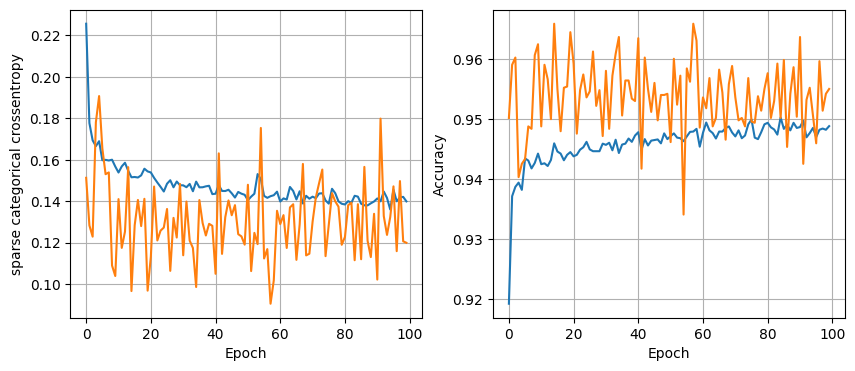

In [ ]:
scaler = StandardScaler()
TX = scaler.fit_transform(X_sm) #Train x scaled
Ty = y_sm

input_shape= X_scaled.shape[1]
least_val_loss = float('inf')
least_loss_model = None
epochs=100

for num_nodes in [16, 32, 64]:
  for dropout_prob in[0, 0.2]:
    for lr in [0.01, 0.005, 0.001]:
      for batch_size in [32, 64, 128]:
        print(f"{num_nodes} nodes, dropout {dropout_prob}, lr {lr}, batch size {batch_size}")
        model, history = train_model(TX, Ty,input_shape, num_nodes, dropout_prob, lr, batch_size, epochs)
        plot_history(history)
        val_loss = model.evaluate(X_valid, y_valid)[0]
        if val_loss < least_val_loss:
          least_val_loss = val_loss
          least_loss_model = model